# Coursework 2: Generative Models

## Instructions

### Submission 
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), please refer to the 4 GPU options detailed in the logistics lecture. Some additional useful pointers:
* PaperSpace [guide if you need more compute](https://hackmd.io/@afspies/S1stL8Qnt)
* Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
* Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
* Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is Monday, 26 Feb by 6 pm** </font>

In [2]:
# !pip install -q torch torchvision altair seaborn
!rm -rf icl_dl_cw2_utils
!git clone -q https://github.com/afspies/icl_dl_cw2_utils 



## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [2]:
!nvidia-smi

Fri Mar  1 09:46:30 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.146.02             Driver Version: 535.146.02   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4080        Off | 00000000:2D:00.0 Off |                  N/A |
|  0%   44C    P8              10W / 320W |  10017MiB / 16376MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:

from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
# Initialization Cell
WORKING_ENV = 'LABS' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
USERNAME = 'ajh23' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER', 'LOCAL']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_cw2_repo_path = 'dl_cw2/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_cw2_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw2/' # You may want to change this
    data_path = f'/vol/bitbucket/{USERNAME}/dl/'
    # Your python env and training data should be on bitbucket
    if 'vol/bitbucket' not in content_path or 'vol/bitbucket' not in data_path:
        import warnings
        warnings.warn(
           'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
           )
elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'
    
elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

elif WORKING_ENV == 'LOCAL':
    content_path = './'
    data_path = './data/'

else:
  raise NotImplementedError()

content_path = Path(content_path)

## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [1]:
import torch
print(torch.__version__)

2.2.0+cu121


In [29]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [30]:
# Necessary Hyperparameters 
num_epochs = 20
learning_rate = 1e-3
batch_size = 128
latent_dim = 4

# Additional Hyperparameters 



# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [31]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [40]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # Additional Conv layer
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(128, 400),  # Increased size
            nn.ReLU(),
            nn.Linear(400, 200),  # Additional Linear layer
            nn.ReLU()
        )

        # Latent space
        self.fc_mu = nn.Linear(200, latent_dim)
        self.fc_logvar = nn.Linear(200, latent_dim)

       # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 200),
            nn.ReLU(),
            nn.Linear(200, 400),  # Additional Linear layer
            nn.ReLU(),
            nn.Linear(400, 128*7*7),  # Increased size
            nn.ReLU(),
            nn.Unflatten(1, (128, 7, 7)),  # Adjusted to match the output size
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # Additional ConvTranspose layer
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=1, padding=1),  # Adjusted kernel size
            nn.Sigmoid()
        )
        
        
      
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # input of dimension (batch_size, 1, 28, 28)
        x = x.view(-1, 1, 28, 28)  # Update this line
        h = self.encoder(x)
        return h

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu = mu.view(-1, self.latent_dim)
        logvar = logvar.view(-1, self.latent_dim)
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        z = mu + eps*std
        return z

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        z = z.view(-1, self.latent_dim)
        x = self.decoder(z)
        return x

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = x.view(-1, 1, 28, 28)  # Reshape the input to [batch_size, channels, height, width]
        h = self.encoder(x)
        mu, logvar = self.fc_mu(h), self.fc_logvar(h)
        z = self.reparametrize(mu, logvar)
        x = self.decoder(z)
        return x, mu, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 3058681
VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
    (6): AdaptiveAvgPool2d(output_size=1)
    (7): Flatten(start_dim=1, end_dim=-1)
    (8): Linear(in_features=128, out_features=400, bias=True)
    (9): ReLU()
    (10): Linear(in_features=400, out_features=200, bias=True)
    (11): ReLU()
  )
  (fc_mu): Linear(in_features=200, out_features=4, bias=True)
  (fc_logvar): Linear(in_features=200, out_features=4, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=4, out_features=200, bias=True)
    (1): ReLU()
    (2): Linear(in_features=200, out_features=400, bias=True)
    (3): ReLU()
    (4): Linear(in_features=400, out_features=6272, bias=True)
    (5): ReLU()
    (6): Unflatten(dim=1, 

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [7]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        loss = F.binary_cross_entropy(recon_x, x, reduction='sum')
        kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return loss + beta * kld, loss, kld
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

def annealed_beta(epoch, max_epochs, start_beta=1e-5, end_beta=1.0):
    return min(start_beta + (end_beta - start_beta) * (epoch / max_epochs), end_beta)


loss_list = []
reco_list = []
kld_list = []

test_loss_list = []
test_reco_list = []
test_kld_list = []
model = model.to(device)
model.train()
# <- You may wish to add logging info here
counter = 0
for epoch in range(num_epochs):  
    # <- You may wish to add logging info here
    running_loss = 0.0
    running_reco = 0.0
    running_kld = 0.0
    test_running_loss = 0.0 
    test_running_reco = 0.0
    test_running_kld = 0.0
    
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):   
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # Zero the gradients
            beta = annealed_beta(epoch, num_epochs)
            data = data.to(device)
            optimizer.zero_grad()
            recon_batch, mu, logvar = model(data)
            loss, reco, kld = loss_function_VAE(recon_batch, data, mu, logvar, beta)
            running_loss += loss.item()
            running_reco += reco.item()
            running_kld += kld.item()
            loss.backward()
            optimizer.step()
            #######################################################################
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/(batch_size*len(loader_train)))
                
    loss_list.append(running_loss/(batch_size*len(loader_train)))
    reco_list.append(running_reco/(batch_size*len(loader_train)))
    kld_list.append(running_kld/(batch_size*len(loader_train)))
    print(f'====> Epoch: {epoch} Average loss: {running_loss/(batch_size*len(loader_train)):.4f}')
    
    with torch.no_grad():
        for batch_idx, (data, _) in enumerate(loader_test):
            data = data.to(device)
            recon_batch, mu, logvar = model(data)
            test_loss, test_reco, test_kld = loss_function_VAE(recon_batch, data, mu, logvar, beta)
            test_running_loss += test_loss.item()
            test_running_reco += test_reco.item()
            test_running_kld += test_kld.item()
    test_loss_list.append(test_running_loss/(batch_size*len(loader_test)))
    test_reco_list.append(test_running_reco/(batch_size*len(loader_test)))
    test_kld_list.append(test_running_kld/(batch_size*len(loader_test)))
    print(f'====> Test set loss: {test_running_loss/(batch_size*len(loader_test)):.4f}')
    

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')


Epoch 0: 100%|█████████████| 469/469 [00:08<00:00, 53.38batch/s, loss=0.298]


====> Epoch: 0 Average loss: 182.1820
====> Test set loss: 139.7230


Epoch 1: 100%|█████████████| 469/469 [00:05<00:00, 93.65batch/s, loss=0.262]


====> Epoch: 1 Average loss: 132.3997
====> Test set loss: 125.4408


Epoch 2: 100%|█████████████| 469/469 [00:05<00:00, 92.74batch/s, loss=0.248]


====> Epoch: 2 Average loss: 124.7625
====> Test set loss: 122.6191


Epoch 3: 100%|█████████████| 469/469 [00:05<00:00, 93.40batch/s, loss=0.243]


====> Epoch: 3 Average loss: 122.2405
====> Test set loss: 120.2951


Epoch 4: 100%|█████████████| 469/469 [00:05<00:00, 92.83batch/s, loss=0.254]


====> Epoch: 4 Average loss: 120.8051
====> Test set loss: 118.8414


Epoch 5: 100%|█████████████| 469/469 [00:05<00:00, 92.62batch/s, loss=0.256]


====> Epoch: 5 Average loss: 119.6513
====> Test set loss: 118.1388


Epoch 6: 100%|█████████████| 469/469 [00:05<00:00, 92.22batch/s, loss=0.256]


====> Epoch: 6 Average loss: 118.7961
====> Test set loss: 118.8986


Epoch 7: 100%|█████████████| 469/469 [00:05<00:00, 92.81batch/s, loss=0.255]


====> Epoch: 7 Average loss: 118.2988
====> Test set loss: 117.7902


Epoch 8: 100%|█████████████| 469/469 [00:05<00:00, 92.38batch/s, loss=0.259]


====> Epoch: 8 Average loss: 117.8167
====> Test set loss: 117.2302


Epoch 9: 100%|█████████████| 469/469 [00:05<00:00, 92.58batch/s, loss=0.257]


====> Epoch: 9 Average loss: 117.4748
====> Test set loss: 118.2583


Epoch 10: 100%|████████████| 469/469 [00:05<00:00, 93.41batch/s, loss=0.249]


====> Epoch: 10 Average loss: 117.4480
====> Test set loss: 117.8777


Epoch 11: 100%|████████████| 469/469 [00:04<00:00, 94.04batch/s, loss=0.257]


====> Epoch: 11 Average loss: 117.2893
====> Test set loss: 117.5589


Epoch 12: 100%|████████████| 469/469 [00:05<00:00, 93.62batch/s, loss=0.251]


====> Epoch: 12 Average loss: 117.2732
====> Test set loss: 117.6374


Epoch 13: 100%|████████████| 469/469 [00:05<00:00, 93.01batch/s, loss=0.229]


====> Epoch: 13 Average loss: 117.3344
====> Test set loss: 117.1585


Epoch 14: 100%|████████████| 469/469 [00:05<00:00, 93.03batch/s, loss=0.257]


====> Epoch: 14 Average loss: 117.2359
====> Test set loss: 118.0413


Epoch 15: 100%|████████████| 469/469 [00:05<00:00, 93.37batch/s, loss=0.243]


====> Epoch: 15 Average loss: 117.4082
====> Test set loss: 117.7087


Epoch 16: 100%|████████████| 469/469 [00:05<00:00, 93.20batch/s, loss=0.241]


====> Epoch: 16 Average loss: 117.5616
====> Test set loss: 117.9505


Epoch 17: 100%|████████████| 469/469 [00:05<00:00, 91.68batch/s, loss=0.263]


====> Epoch: 17 Average loss: 117.7916
====> Test set loss: 117.5941


Epoch 18: 100%|████████████| 469/469 [00:05<00:00, 92.73batch/s, loss=0.254]


====> Epoch: 18 Average loss: 118.1171
====> Test set loss: 118.4656


Epoch 19: 100%|████████████| 469/469 [00:05<00:00, 92.25batch/s, loss=0.262]


====> Epoch: 19 Average loss: 118.0925
====> Test set loss: 119.1511


### Loss Explanation
Explain your choice of loss and how this relates to:
* The VAE Prior
* The output data domain
* Disentanglement in the latent space


**YOUR ANSWER**

##### * The VAE Prior
The KLD (Kullback-Leibler Divergence) relates to the VAE Prior. This term ensures that the distribution of the latent variables align with a given VAE prior distribution. The prior distibution itself serves as a regularization mechanis,/ KLD penalizes the divergence between the actual distribution of the latent variables and the desired prior distribution.

##### * The output data domain
In relation to the output data domain, Binary cross-entropy was the chosen reconstruction loss function. The data we are using has pixel values that are noarmalized between 0 and 1, and as suchh this makes binary cross entropy a suitable loss function. This loss function measures the dissimilarity between the reconstructed output and the actual input, with a particular focus on capturing the nuances of binary data. It ensures that the generated outputs are not only close to the original data but also respect the specific characteristics of the data domain, contributing to the overall fidelity of the reconstruction.

##### * Disentanglement in the latent space
The KLD term in the loss function encoruages the latent space to be disentangled by penalising deviations from a prior distribution. Disentagnglement itself implies that each dimension in the latent space captures a distinct and interpretable feature of the data. By penalizing deviations from the chosen prior distribution, the KLD term guides the model to assign different dimensions of the latent space to different aspects of the data. This promotes a structured and disentangled latent representation, facilitating better control and understanding of the underlying factors that contribute to the variability in the data.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

### With Beta Annealing

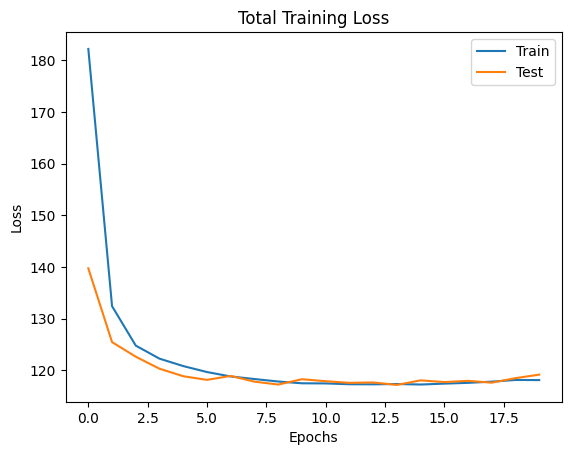

In [8]:
# *CODE FOR PART 1.2a IN THIS CELL*
# plot loss curve
plt.plot(loss_list)
plt.plot(test_loss_list)
plt.title('Total Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

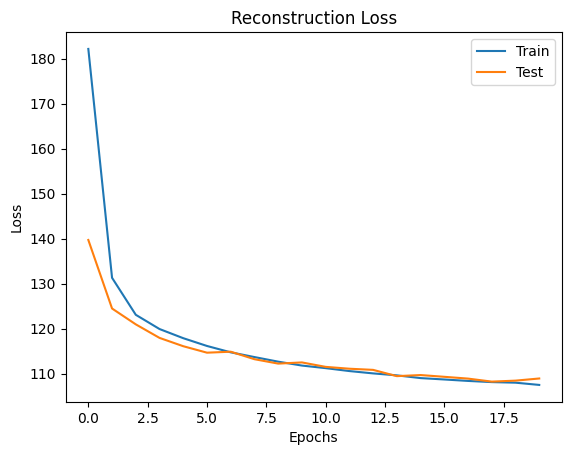

In [9]:
# Plot the reconstruction loss
plt.plot(reco_list)
plt.plot(test_reco_list)
plt.title('Reconstruction Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()


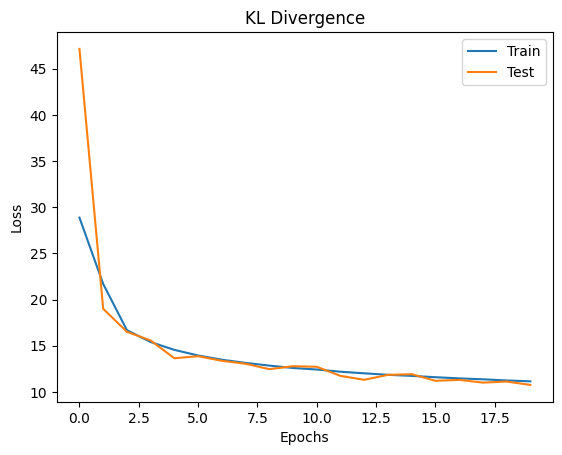

In [10]:
# Plot the KL divergence
plt.plot(kld_list)
plt.plot(test_kld_list)
plt.title('KL Divergence')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

#### With Beta = 0.3

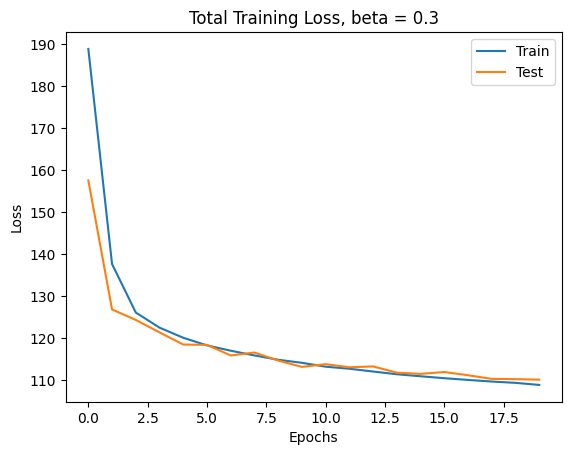

In [34]:
plt.plot(loss_list)
plt.plot(test_loss_list)
plt.title('Total Training Loss, beta = 0.3')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

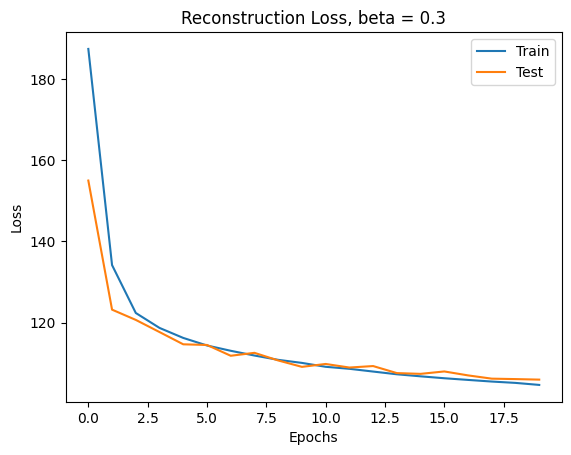

In [35]:
plt.plot(reco_list)
plt.plot(test_reco_list)
plt.title('Reconstruction Loss, beta = 0.3')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

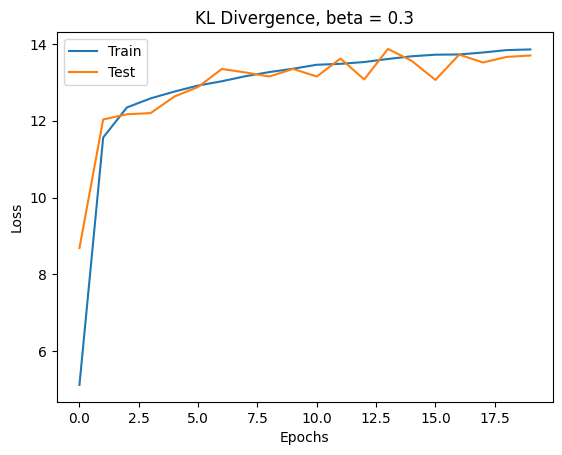

In [36]:
plt.plot(kld_list)
plt.plot(test_kld_list)
plt.title('KL Divergence, beta = 0.3')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

### With Beta = 0.7

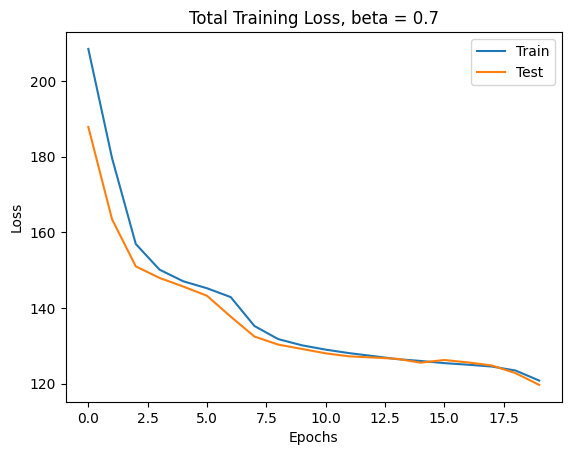

In [42]:
plt.plot(loss_list)
plt.plot(test_loss_list)
plt.title('Total Training Loss, beta = 0.7')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

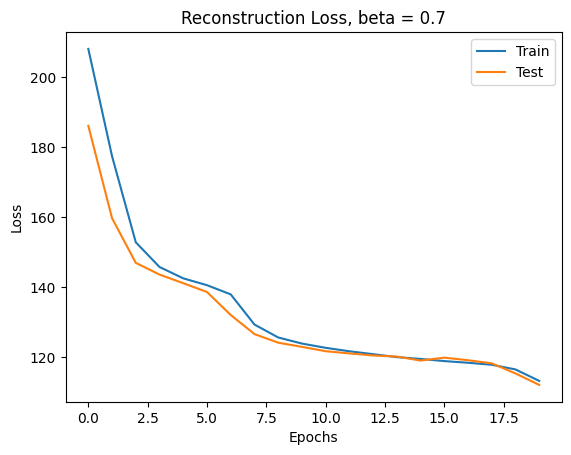

In [43]:
plt.plot(reco_list)
plt.plot(test_reco_list)
plt.title('Reconstruction Loss, beta = 0.7')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()


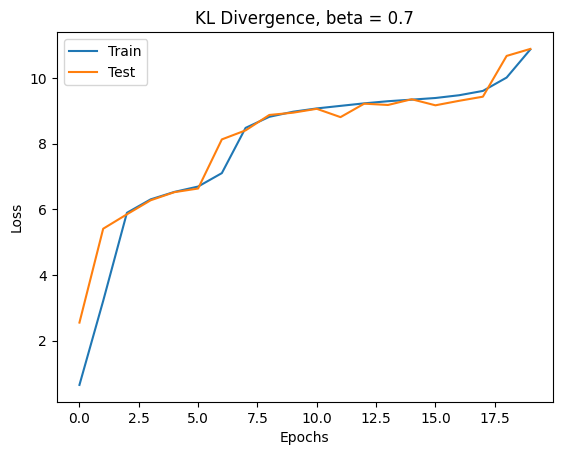

In [44]:
plt.plot(kld_list)
plt.plot(test_kld_list)
plt.title('KL Divergence, beta = 0.7')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.show()

Clearly, the choice of beta has a significant impact on the loss functions. A constant low beta results in constant reco loss domination. We do see a smooth curve however for the total loss function. 0.7 results almost in a sort of step shape, with no clear or smooth shape to it. Both of these have increasing KLDs. The use of beta annealing allows for the KLD to avoid being dominated by the reco loss, and results in smooth loss curves for the total loss, reco loss and KLD - all of which are decreasing

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


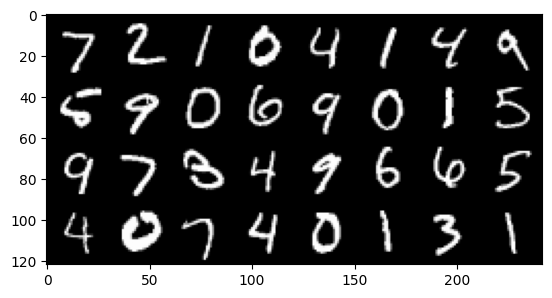

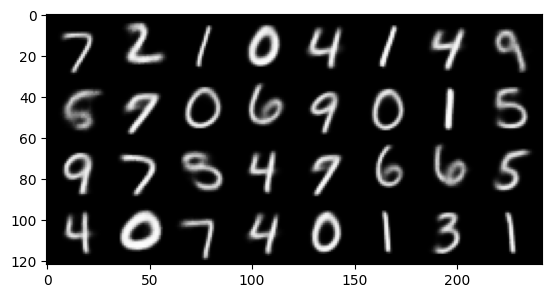

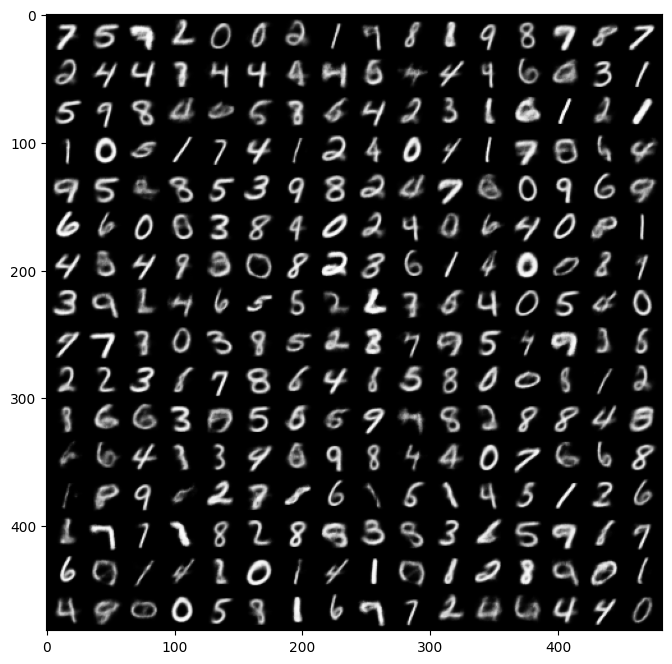

In [11]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :].to(device)
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, _, _ = model(fixed_input)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

### Discussion
Provide a brief analysis of your loss curves and reconstructions, Can you intuitively explain if this behaviour is desirable? : 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
Initially I observed that the log-likelihood loss was decreasing while the KL loss was increasing. This is not desireable, as we would like both to be decreasing over time. This was a result of my keeping my KLD beta low constantly, resulting in the log-likelihood loss dominating the KLD. Due to this domination, KLD was permitted to increase as the log-likelihood loss would decrease a sufficient amount relative to the KLD that the total loss would still decrease, which is ultimately what the VAE aims to achieve. This meant that while reconstruction loss was improving, the latent space was getting increasingly entangled. In order to account for this, an annealed beta was used. This means that the weighting factor beta was initially kept very small in order to allow the reconstruction loss to improve quickly. With each epoch, beta is increased putting more of a focus on the KLD loss and improving that. This means that the large improvements in loss for the reco loss will have happened by the time KLD is weighted heavier, preventing it from being dominated. Using this method, both KLD and log-likelihood loss were found to decrease.


It is desirable for both the KLD and Reco loss functions to decrease because it indicates that the model is simultaneously improving in accurately reconstructing input data and effectively organizing the latent space structure. This balance ensures that the Variational Autoencoder optimizes both generation quality and latent space representation, leading to a more robust and meaningful model.



* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

    Posterior collapse occurs when the VAE's decoder ignores the latent variables, often because the KL divergence becomes too small, making the latent space uninformative. I did indeed experience posterior collapse when I was training. It is not observable in the loss function provided, but basically it start near 0 and after a few epochs it shot up, before then decreasing like normal. I managed to mitigate this by increasing the number of latent dimensions I was using from 2 to 4. When I did have it, I found that my output samples were more a bit more blurred and a couple were a little to hard to identify. Posterior collapse often results in blurry or less distinct outputs because the model is not effectively using the latent space to capture the variations in the data. After fixing it the majority of my samples are very clear.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
import altair
print(altair.__version__)

4.2.2


In [ ]:
# Interactive Visualization - Code Provided
from sklearn.manifold import TSNE
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
z_embedded = []
model.eval()    
with torch.no_grad():
    for batch_idx, (data, _) in enumerate(test_dataloader):
        data = data.to(device)
        x = model.encode(data)
        mu, logvar = model.fc_mu(x), model.fc_logvar(x)
        z = model.reparametrize(mu, logvar)
        z_embedded.append(z.cpu().numpy())  # Convert tensor to numpy array

z_embedded = np.concatenate(z_embedded, axis=0)  # Concatenate all arrays into one
z_embedded = TSNE(n_components=2, random_state=0).fit_transform(z_embedded)  # Fit and transform the data
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)

/vol/bitbucket/ajh23/dl/venv/lib/python3.10/site-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.HConcatChart(...)

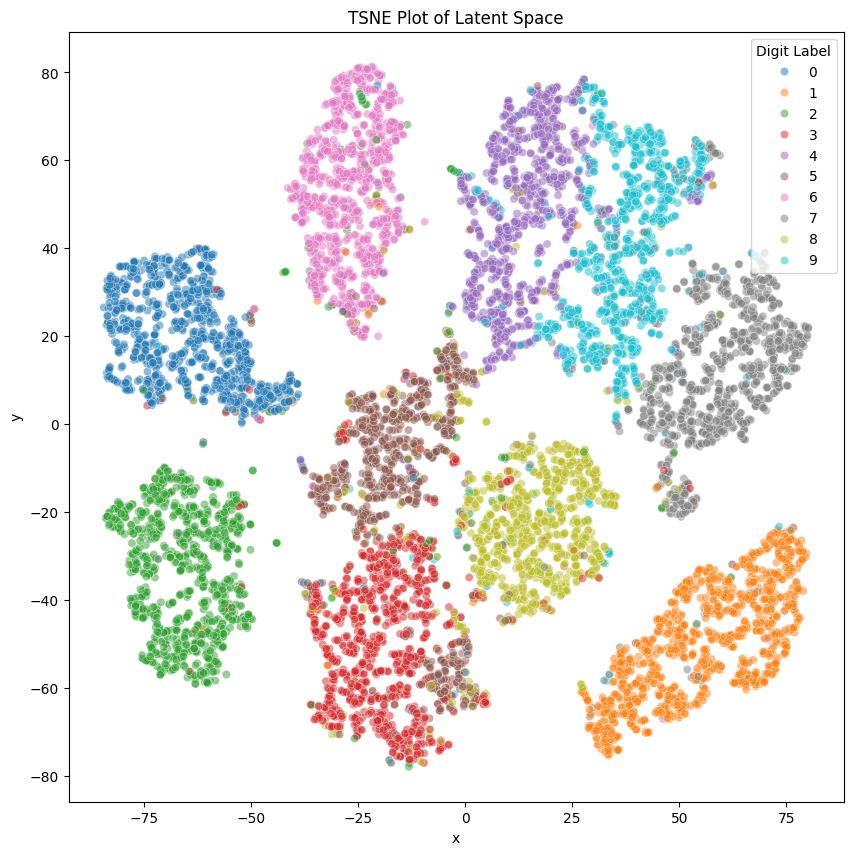

In [ ]:
# Custom Visualizations
# make a custom TSNE plot using matplotlib or seaborn
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
z_embedded = []
model = model.to(device)
model.eval()    
with torch.no_grad():
    for batch_idx, (data, _) in enumerate(test_dataloader):
        data = data.to(device)
        x = model.encode(data)
        mu = model.fc_mu(x)
        logvar = model.fc_logvar(x)
        z = model.reparametrize(mu, logvar)
        z_embedded.append(z.cpu().numpy())  # Convert tensor to numpy array
        
z_embedded = np.concatenate(z_embedded, axis=0)  # Concatenate all arrays into one

from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd

# Define labels for Mnist 
labels = []
for batch_idx, (data, label) in enumerate(test_dataloader):
    labels.append(label.numpy())
labels = np.concatenate(labels, axis=0)


tsne = TSNE(n_components=2, random_state=0)
z_embedded = tsne.fit_transform(z_embedded)
df = pd.DataFrame({'x': z_embedded[:, 0], 'y': z_embedded[:, 1], 'label': labels})

plt.figure(figsize=(10, 10))

# Use hue to color points based on the 'label' column
sns.scatterplot(data=df, x='x', y='y', hue='label', palette='tab10', alpha=0.5)

plt.title('TSNE Plot of Latent Space')
plt.legend(title='Digit Label')
plt.show()




### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

In both my own plot and that generated using the code provided there are very clear clusters for each number. Note that both graphs I think do show the same thing, just flipped and with different colours for the numbers. As mentioned the clusters are very clear, and for the majority of them there are defined boundaries of empty space seperating them. The exception is the cluster of 8,3,5 (more clear on my own plot) where we can see some overlap, particularly with 5 and 8. This is does make sense, a poorly drawn 5 could look like both the top and bottom loop up to look like what could be an 8. I use beta aneealing in my VAE, so realistically my beta changes and it makes it more difficult to directly measure the impact of different constant betas. In theory though the KL loss and beta influence and control the trade off between good data reconstruction and the exploration of a well-organized latent space. This in turn would result in clearer, more spread out clusters with better defined boundaries (or the other way around, where clusters and boundaries become harder to distinguise)!

Upon running this again I have also noticed 3 more clusters with very unclear boundaries at 4, 9, 7. 4 and 9 have very similar shapes, so it makes sense to me that theres some overlap there. There are a few outliers in my plots, but nothing really substantial/

T-SNE is not always reliable because its optimization is sensitive to its hyperparameters, and different parameters may have significantly different visualisations. This method can also distort distances between clusters, which in tern could lead to misinterpretations of true underlying relationships.

In [48]:
assert False, "Stop here, do not run the next two code blocks"

AssertionError: Stop here, do not run the next two code blocks

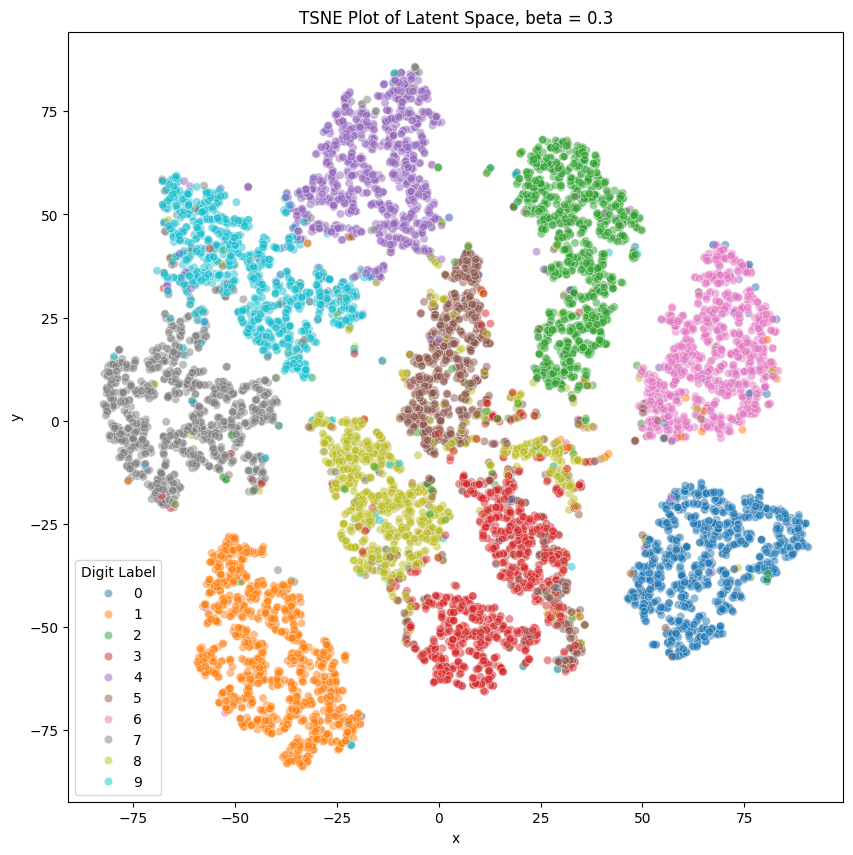

In [39]:
##### DO NOT RUN THIS CODE
plt.figure(figsize=(10, 10))
# Use hue to color points based on the 'label' column
sns.scatterplot(data=df, x='x', y='y', hue='label', palette='tab10', alpha=0.5)
plt.title('TSNE Plot of Latent Space, beta = 0.3')
plt.legend(title='Digit Label')
plt.show()

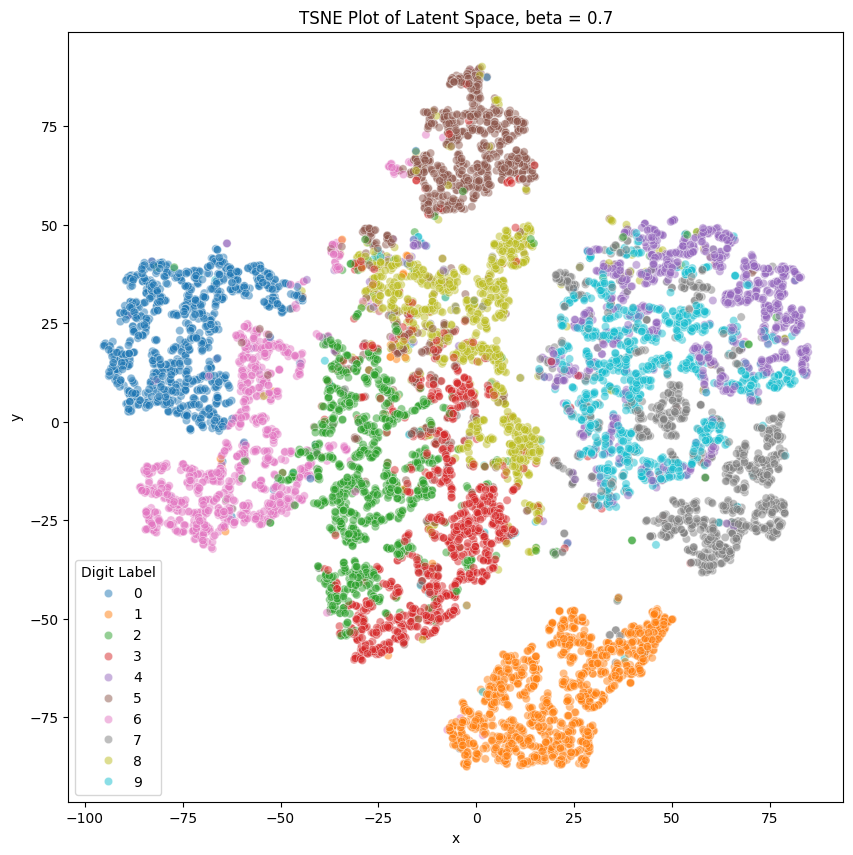

In [46]:
plt.figure(figsize=(10, 10))
# Use hue to color points based on the 'label' column
sns.scatterplot(data=df, x='x', y='y', hue='label', palette='tab10', alpha=0.5)
plt.title('TSNE Plot of Latent Space, beta = 0.7')
plt.legend(title='Digit Label')
plt.show()

I also investigated the effects of varying the values of beta as part of my analysis. We can see that a lower beta results in more compact clusters, spread further apart from each other with clear boundaries. A higher constant value of beta however results in  much more overlap between the clusters, and less defined boundaries.  Varying the beta parameter in a Variational Autoencoder affects the trade-off between reconstruction fidelity and latent space regularization, with lower betas favoring distinct, well-separated clusters due to better reconstruction, and higher betas leading to more overlap and less defined cluster boundaries due to stronger emphasis on latent space organization. Crucially, a lower beta results in reco loss domination, and for the reconstruction to be accurate we require distinct locations for the different classes. If however, beta would be increased well beyond 1, we could hypothesis that the KLD could dominate, and as this aims to organise the latent space this also could result in clear clusters/

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


tensor([-0.7455, -0.6742, -0.1111,  0.0149], device='cuda:0') tensor([ 0.9676, -2.0181, -1.7479,  0.3519], device='cuda:0')


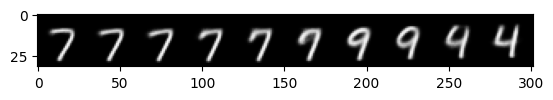

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
# plot a linear interpolation between two points in the latent space
# Select two digits from the test set
digit_one = 4
digit_two = 7

image_idx = 0
latent_one = None
latent_two = None



# Find the latent representation of the two digits
model.eval()
with torch.no_grad():
    for batch_idx, (data, label) in enumerate(loader_test):
        data = data.to(device)
        x = model.encode(data)
        mu = model.fc_mu(x)
        logvar = model.fc_logvar(x)
        z = model.reparametrize(mu, logvar)
        
        for i in range(len(label)):
            if label[i].item() == digit_one:
                latent_one = z[i]
            elif label[i].item() == digit_two:
                latent_two = z[i]

            if latent_one is not None and latent_two is not None:
                break

        if latent_one is not None and latent_two is not None:
            print(latent_one, latent_two)
            break
        
# Interpolate between the two latent representations
n_steps = 10

interpolated_images = []
model.eval()
with torch.no_grad():
    for alpha in np.linspace(0, 1, n_steps):
        latent = alpha * latent_one + (1 - alpha) * latent_two
        img = model.decode(latent)
        interpolated_images.append(img)
        
interpolated_images = torch.stack(interpolated_images)
interpolated_images = interpolated_images.view(-1, 1, 28, 28)
interpolated_images = make_grid(denorm(interpolated_images), nrow=n_steps, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
plt.figure()
show(interpolated_images)


### Discussion
What did you observe in the interpolation? Is this what you expected?



* Can you relate the interpolation to your T-SNE visualization


**YOUR ANSWER**

Interpolation is the process of generating new data points by taking the weighted averaged between points in the latent space..We can see the interpolation moving through the latent space as the 7 slowly morphs into a 4. We can see that during this transition, it passed through the region of space that would return 9s. This is consistent with what is observed in the T-SNE plots, as the 9 cluster sits wedged between the 7 and 4 clusters. These results are what I would be expecting.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [5]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def unnormalizer(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
             x = x.view(x.size(0), channels, w, h)
    return x

def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

/vol/bitbucket/ajh23/dl/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [52]:
batch_size = 128  # change that

transform = transforms.Compose([
     # reshape to 64x64
     transforms.Resize(64),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))    
])

# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

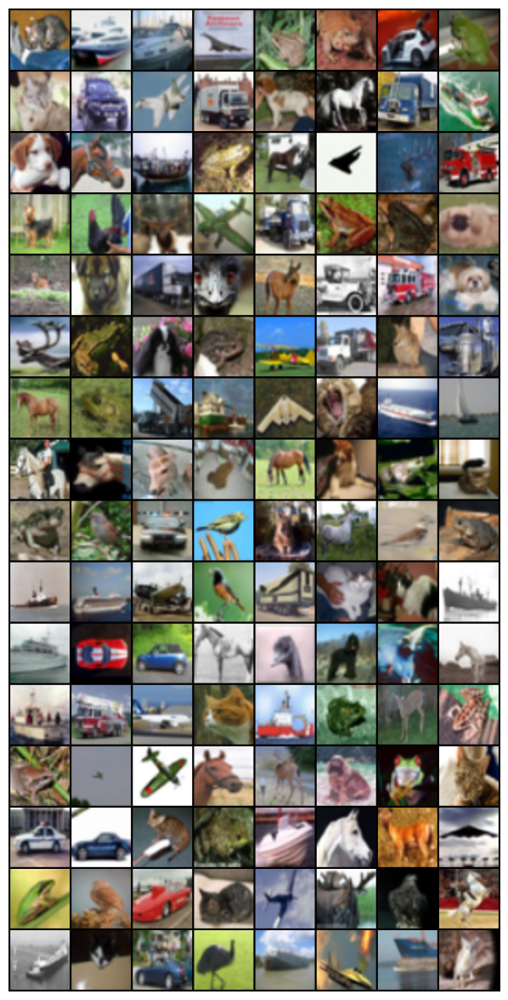

In [53]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
#samples = make_grid(denorm(samples), nrow=8, padding=3, normalize=False,
                        #value_range=None, scale_each=False, pad_value=0)
samples = make_grid(unnormalizer(samples, channels=3, w=64, h=64), nrow=8, padding=2, normalize=False)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [40]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 150
latent_vector_size = 200
batch_size = 128
# Other hyperparams


In [41]:
# CODE FOR PART 2.1 IN THIS CELL

G_chans = 108
D_chans = 108

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            # Initial layer to upscale the latent vector
            nn.ConvTranspose2d(latent_vector_size, G_chans * 8, 4, 2, 0, bias=False),
            nn.BatchNorm2d(G_chans * 8),
            nn.ReLU(True),
            # Output: [batch_size, G_chans * 16, 4, 4]

            # Additional layers to upscale to the desired output size
            nn.ConvTranspose2d(G_chans * 8, G_chans * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(G_chans * 4),
            nn.ReLU(True),
            # Output: [batch_size, G_chans * 8, 8, 8]

            nn.ConvTranspose2d(G_chans * 4, G_chans * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(G_chans * 2),
            nn.ReLU(True),
            # Output: [batch_size, G_chans * 4, 16, 16]

            nn.ConvTranspose2d(G_chans * 2, G_chans, 4, 2, 1, bias=False),
            nn.ReLU(True),
            # Output: [batch_size, G_chans * 2, 32, 32]

            nn.ConvTranspose2d(G_chans, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # Final Output: [batch_size, 3, 64, 64]
        )
        self.sat_param = nn.Parameter(torch.tensor([1.0, 1.0, 1.0]))

    def forward(self, x):
        output = self.model(x)
        return output * self.sat_param.view(1, 3, 1, 1)



class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # Layer 1: Downsample to 32x32
            nn.Conv2d(3, D_chans, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            # Output: [batch_size, D_chans, 32, 32]

            # Layer 2: Downsample to 16x16
            nn.Conv2d(D_chans, D_chans *2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_chans * 2),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            # Output: [batch_size, D_chans * 2, 16, 16]

            # Layer 3: Downsample to 8x8
            nn.Conv2d(D_chans * 2, D_chans * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_chans * 4),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            # Output: [batch_size, D_chans * 4, 8, 8]

            # Layer 4: Downsample to 4x4
            nn.Conv2d(D_chans * 4, D_chans * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_chans * 8),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            # Output: [batch_size, D_chans * 8, 4, 4]

            # Final Layer: Reduce to a single value
            nn.Conv2d(D_chans * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: [batch_size, 1, 1, 1]
        )

    def forward(self, input):
        output = self.model(input)
        return output.squeeze()

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [42]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [51]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 10611219
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(200, 864, kernel_size=(4, 4), stride=(2, 2), bias=False)
    (1): BatchNorm2d(864, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(864, 432, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(432, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(432, 216, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(216, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(216, 108, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): ReLU(inplace=True)
    (11): ConvTranspose2d(108, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): Tanh()
  )
)


Total number of parameters in Di

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [44]:
# You can modify the arguments of this function if needed
def gan_loss(out, labels):
    # Generator loss
    out = out.float()
    labels = labels.float()
    loss = F.binary_cross_entropy(out, labels)
    return loss

<h3>Choose and initialize optimizers</h3>

In [50]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.

noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
sample_labels = torch.randint(0,10,(batch_size,),device = device, dtype = torch.long)
fake = model_G(noise)
print(fake.shape)

torch.Size([128, 3, 64, 64])


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [54]:

fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [46]:
import random as r

torch.cuda.empty_cache()

In [49]:
print(batch_size)

128


In [56]:
train_losses_G = []
train_losses_D_Real = []
train_losses_D_Fake = []

learning_rateG = 0.0005
learning_rate_D = 0.0005
beta1 = 0.5
num_epochs = 150
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate_D, betas=(beta1, 0.9))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rateG, betas=(beta1, 0.9))

# Define LR schedulers for both optimizers
schedulerD = StepLR(optimizerD, step_size=25, gamma=1)
schedulerG = StepLR(optimizerG, step_size=30, gamma=1)
true = 0.9
false = 0.1
num_disc_updates = 1

# Training loop
for epoch in range(num_epochs):
    running_g_loss = 0.0
    running_d_real_loss = 0.0
    running_d_fake_loss = 0.0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch, 0):
            for _ in range(num_disc_updates):
                ###########################
                # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
                ###########################
                # train with real
                optimizerD.zero_grad()
                real_data = data[0].to(device)
                batch_size = real_data.size(0)
                label = torch.full((batch_size,), true, device=device)

                output = model_D(real_data)  
                errD_real = gan_loss(output, label)
                errD_real.backward()
                running_d_real_loss += errD_real.item()
                D_x = output.mean().item()

                # train with fake
                noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
                fake = model_G(noise)
                label = torch.full((batch_size,), false, device=device)
                output = model_D(fake) 
                errD_fake = gan_loss(output, label)
                errD_fake.backward()
                running_d_fake_loss += errD_fake.item()
                D_G_z1 = output.mean().item()
                errD = errD_real + errD_fake
                optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            
            optimizerG.zero_grad()
            label = torch.full((batch_size,), true, device=device)  # fake labels are real for generator cost
            
            fake = model_G(noise)
            output = model_D(fake)
            errG = gan_loss(output, label)
            errG.backward()
            running_g_loss += errG.item()
            D_G_z2 = output.mean().item()
            optimizerG.step()
            
            
            # Logging
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                # print losses
                tepoch.set_postfix(D_real=errD_real.item(), D_fake=errD_fake.item(), G=errG.item())
                
    schedulerD.step()
    schedulerG.step()

    # Save generated samples and models at the end of each epoch
    if epoch == 0:
        save_image(unnormalizer(real_data).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        label = torch.randint(0,10,(128,),device = device, dtype = torch.long)
        fake = model_G(fixed_noise)
        save_image(unnormalizer(fake.cpu(), resize=True, w=32, h=32, channels=3).float(), str(content_path/'CW_GAN/fake_samples_epoch_%03d.png') % epoch)
        # Also print the image
        #img = make_grid(unnormalizer(fake.cpu()), nrow=8, padding=2, normalize=False).permute(1, 2, 0).numpy()
        #plt.figure(figsize=(8, 8))
        #plt.imshow(img)
        #plt.axis('off')
        #plt.show()

    # Append the average losses for visualization, running loss divided by number of images
    train_losses_D_Real.append(running_d_real_loss/len(loader_train))
    train_losses_D_Fake.append(running_d_fake_loss/len(loader_train))
    train_losses_G.append(running_g_loss/len(loader_train))

# Save models
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Epoch 0: 100%|█| 391/391 [00:28<00:00, 13.72batch/s, D_fake=0.713, D_real=0.
Epoch 1: 100%|█| 391/391 [00:28<00:00, 13.77batch/s, D_fake=0.863, D_real=0.
Epoch 2: 100%|█| 391/391 [00:28<00:00, 13.75batch/s, D_fake=0.755, D_real=0.
Epoch 3: 100%|█| 391/391 [00:28<00:00, 13.78batch/s, D_fake=0.743, D_real=0.
Epoch 4: 100%|█| 391/391 [00:28<00:00, 13.73batch/s, D_fake=0.503, D_real=0.
Epoch 5: 100%|█| 391/391 [00:28<00:00, 13.69batch/s, D_fake=0.99, D_real=0.4
Epoch 6: 100%|█| 391/391 [00:28<00:00, 13.66batch/s, D_fake=0.839, D_real=0.
Epoch 7: 100%|█| 391/391 [00:28<00:00, 13.71batch/s, D_fake=0.831, D_real=0.
Epoch 8: 100%|█| 391/391 [00:28<00:00, 13.73batch/s, D_fake=0.931, D_real=0.
Epoch 9: 100%|█| 391/391 [00:28<00:00, 13.68batch/s, D_fake=0.939, D_real=0.
Epoch 10: 100%|█| 391/391 [00:28<00:00, 13.66batch/s, D_fake=0.667, D_real=0
Epoch 11: 100%|█| 391/391 [00:28<00:00, 13.71batch/s, D_fake=0.59, D_real=0.
Epoch 12: 100%|█| 391/391 [00:28<00:00, 13.66batch/s, D_fake=0.655, D_real=0

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=18aWqRAnAVTRDY52y1yHSCdqSxUFRKOS9" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1ymO2-jGAvWeUR2kaj_LxQcGYF1RWNRnw" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=13SW62ekW32NMYtfcdm_dCJJ3ZMOZEZAJ" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

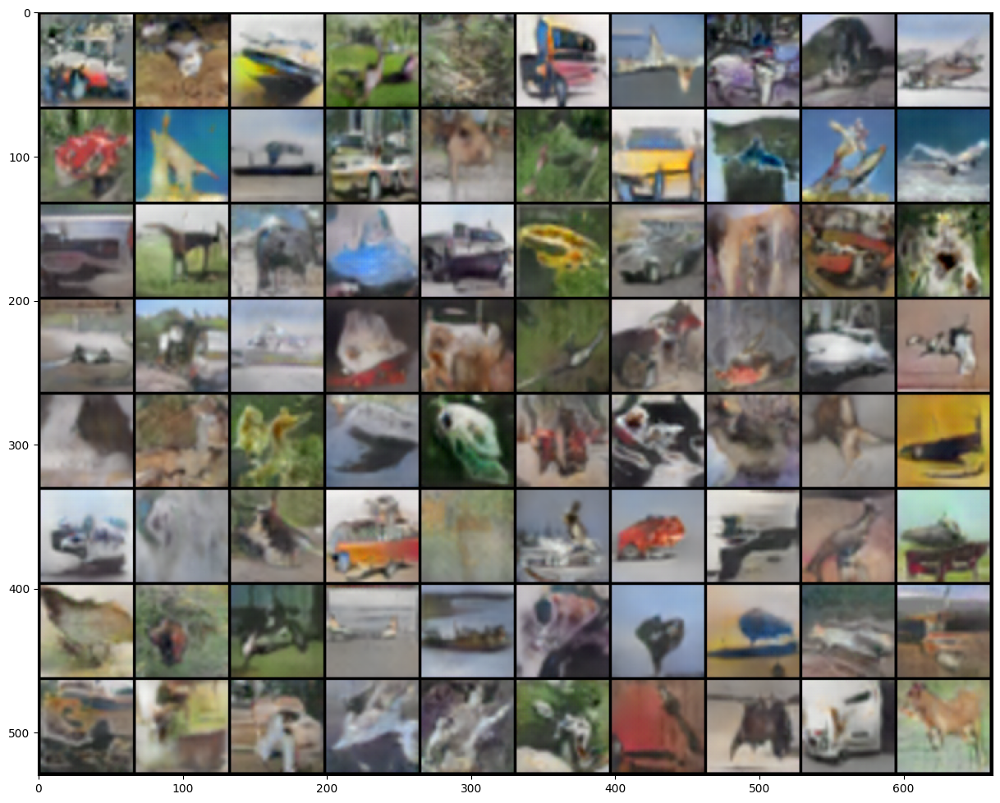

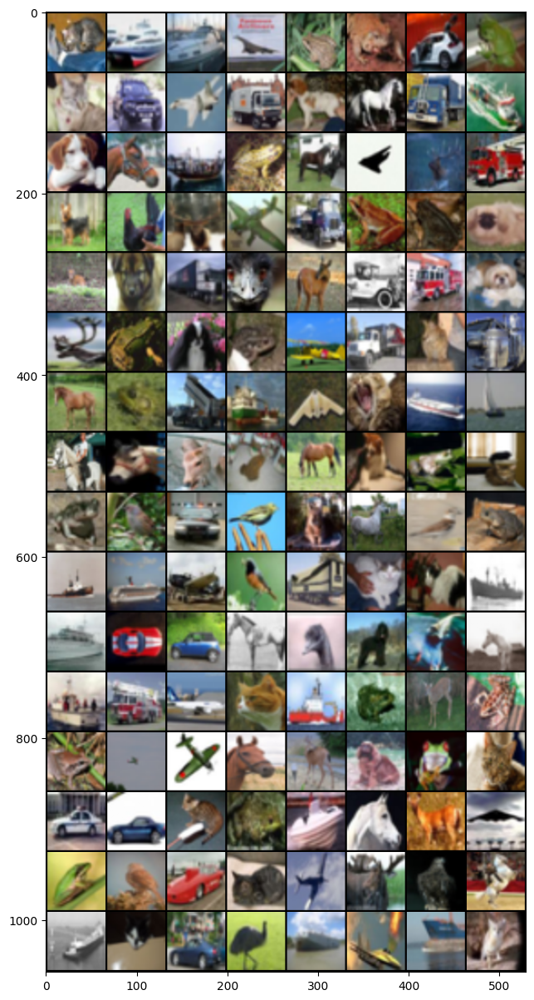

In [70]:
input_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu() * 2
    generated = make_grid(unnormalizer(generated, resize=True, channels=3, w=32, h=32)[0:128], nrow=10, padding=2, normalize=False, 
                        value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:128, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(unnormalizer(fixed_input, resize=True, w=32, h=32, channels=3), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here



**Your Answer**
Architecture: I started off of the paper linked in this document. I then played around with different numbers of layers and also tried introducting in some linear layers as well. I found that none of this really boosted performance massively, and I didn't want to increase the parameter count too much for the obvious reason that it would blow up my already long training time. Instead I would use smaller models first, assess which ones seemed promising before then upping the training time for a proper analysis.

 I used a variable parameter to determine the number of filters I use in my GAN, and doing it this way allowed me flexibility with the model. I also found that my GAN was producing quite dark images, so to counteract this I initially multipled the output by a constant (typically 2 or 2.5) to increase the brightness (or saturation). I introduced dropout as well, which seemed to help prevent the model from producing overly dim images. My working belief is that the gan was able to fool the discriminator by kind of taking an average of colours, allowing it to dim and then overfitting to this. Dropout prevented this from occuring to some extent, and in turn maintained the brightness of the output images (at least better than before). I made sure to also implement appropriate batch normalisation in my architecture 
 
 I tried huge variances in the number of parameters in my model, from a few hundred thousand to about 24 million. In this research I found that between 12 and 20 million seemed to perform the best out of them all (which I know is a large range, but the differences weren't huge, at least not to my eyes). As this range proved similar in performance, I chose to try keep my GAN on the smaller side so that it would train faster. I investigated messing around with the dimensions of the latent vector as well, between 100 and 200. I found around 200ish was the best performing. I also chose eventually to add a trainable parameter to the output of the network, in order to control the saturation and prevent image dimming. Initially I was just manually doubling the output values, or even multiplying them by 2.5. Then I realised that I was working with an ML algorithm, so instead of me messing around with it I defined a parameter that the network could train in order to try and prevent that dimming effect. I had to try different shapes/intial values for this parameter as I kept encountering situations where I had too much saturation, but eventually i eventually found a starting value I was happy with.

Pre-Processing: I tried a variety of different preprocessing methods. The first was image resizing, specifcally upscaling from 32x32 to 64x64. I did find that this resulted in a noteable improvement in image quality (not necessarily the loss curves however) and thus I chose to maintain this. I also changed the normalisation of the images to ensure they were in the range [-1, 1]. This was very important, as I use a tanh activation in my generator. Tanh of course returns values in the range [-1, 1], and as such the images should be normalised in such range. Note that I implemented this after the learnable parameter for saturation. In practice, these could have the same results during training.

Before training loop: I messed around with different values of beta1 between 0.3 and 0.9. I found that 0.5 was the best performing, although I perhaps was not allowing the GAN huge amounts of training time so it is possible another could have been better. I kept with ADAM optimizer. I also tried lowering the starting beta to around 0.3, but this did not seem to return high quality images. I did a lot of experimentation with learning rates between 1e-1 and 1e-5, before eventually settling on the 0.002. I also ended up implementing a learning rate scheduler, as I thought that this might assist the model refining finer points. Ultimately though, I did not notice a huge difference. I ended up just sticking with a set learning rate. I think for future experimentation, I would have liked to try and seen the effects of different scheduling for the discriminator and generator.

During training loop: As I train I use label smoothing. Label smoothing is used when training a GAN to prevent the discriminator from becoming overly confident and to introduce a level of uncertainty in the labeling of real and fake samples. By assigning values slightly less than 1 for real samples and slightly more than 0 for fake samples, label smoothing can enhance GAN stability and improve the generator's ability to produce diverse and realistic samples. Further more, I introduced an internal training loop from my GAN in order to give additional training for my discriminator at different ratios relative to the generator. I tried a 1:1 ratio, a 2:1 ratio and a 5:1 ratio. Ultimately, I found that didn't make a massive difference, but to me it felt like a logical thing to do so I ended up choosing to maintain my 2:1 ratio.

Other notes: The hyperparameter search for the GAN did prove an interesting challenge. Typically when doing such a search a large grid search/random search is often quite affective. However, prioritising image quality for a grid search is no easy task (though I imagine one could evaluate a given GANs images by comparing output pixel values and true values to determine some sort of metric) and as such a lot of experimentation had to be done. I actually did at certain points end up with higher quality images than seen in the current run (see the folder attached in the ZIP called other model examples), but I ended up deciding that I did not have the time to retrain on all the better combinations as I had ongoing NLP, SEMLS, DGL, Group Project and ethics in AI courseworks.

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

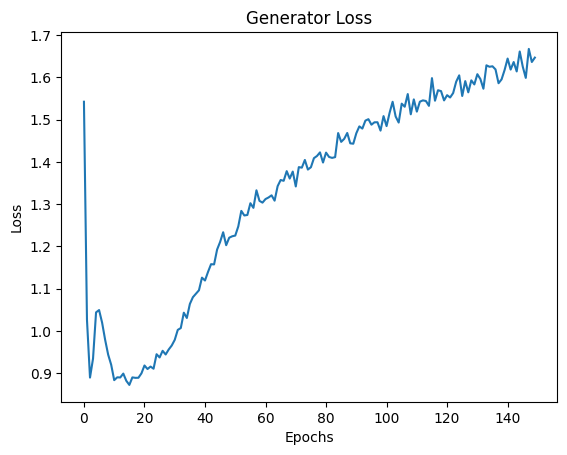

In [71]:

plt.plot(train_losses_G)
plt.title('Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

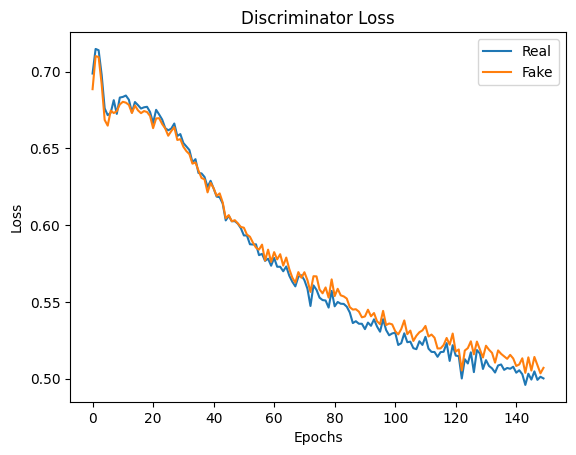

In [72]:
#plot real and fake losses
plt.plot(train_losses_D_Real)
plt.plot(train_losses_D_Fake)
plt.title('Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Real', 'Fake'])
plt.show()


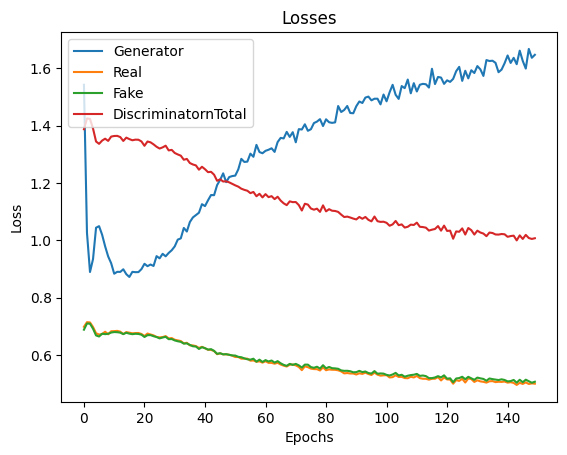

In [74]:
# overlap both losses and generator loss
plt.plot(train_losses_G)
plt.plot(train_losses_D_Real)
plt.plot(train_losses_D_Fake)
train_d_loss = [train_losses_D_Real[i] + train_losses_D_Fake[i] for i in range(len(train_losses_D_Real))]
plt.plot(train_d_loss)
plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Generator', 'Real', 'Fake', 'DiscriminatornTotal'])
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

In the overall sense, these do look somewhat sensible to me discriminator loss curve makes sense to me. Commonly in GAN training, the discriminator loss increases a small bit initially, before decreasing over time indicating that it is performing well in distinguishing real data from fake data produced by the generator. We would maybe expect a bit more variance between the real and fake loss components. We also see that it looks like it is almost convergent to a point; this suggests it is at a stable state in training and perhaps is not being sufficiently challenged by the GAN

The GAN loss seems to be increasing over time. This could suggest two things: the first is that the image quality is not increasing over time, however when looking at the images this is not the case. The second possibility is that the discriminator is too strong compared to the generator as well. If more time allowed, I would do further experiments with varying the learning rates between the generator and discriminator in order to account for this. I would expect in practice for this loss curve to reduce as well


## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

### Discussion


**YOUR ANSWER**

Mode collapse in Generative Adversarial Networks occurs when the generator consistently produces a limited set of outputs, ignoring the diversity present in the target distribution. This can result in a lack of variety and fidelity in generated samples, limiting the overall effectiveness of the GAN.  Manifestations of mode collapse include generated samples that share similar patterns, textures, or features, often resulting in a limited range of outputs that fail to capture the full complexity and diversity of the target data distribution. As I was starting working on the GAN I experienced mode collapse a lot, specifically the repetition of very poor blurry images that were quite blotchy. In order to mitigate this I introduced the label smoothing seen earlier. Label smoothing basically stops the discriminator getting too confident, making mode collapse less likely. I also varied the learning rate between 2e-2 and 2e-5 and found that this ended up helping as well. Critically, at one point I had a batchnorm layer right before my generator output which caused mode collapse. Removing this also removed my issues. Having batch normalization immediately before the generator output can lead to mode collapse because it can cause the generator to amplify noise and variations in the data, leading it to produce a limited range of outputs that are not diverse enough.

When I got mode collapse I also would see a grid of squares that were mostly grey tones with occasionally a flash of colour through it, though every image on the grid would be near identical. I did not really encounter the type of mode collapse where we have repeated, but of decent quality, images. It was always very extreme, and very initial.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [6]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "/data" # You can change this to = data_path when testing
#ta_data_path = data_path

In [ ]:
!pip install -q torch torchvision

In [3]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [4]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def unnormalizer(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
             x = x.view(x.size(0), channels, w, h)
    return x

latent_vector_size = 200
gan_latent_size = latent_vector_size

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [7]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

100%|██████████| 9912422/9912422 [00:02<00:00, 3806041.34it/s]


Extracting /data\MNIST\raw\train-images-idx3-ubyte.gz to /data\MNIST\raw



100%|██████████| 28881/28881 [00:00<00:00, 28896873.53it/s]


Extracting /data\MNIST\raw\train-labels-idx1-ubyte.gz to /data\MNIST\raw



100%|██████████| 1648877/1648877 [00:00<00:00, 3026345.02it/s]


Extracting /data\MNIST\raw\t10k-images-idx3-ubyte.gz to /data\MNIST\raw



100%|██████████| 4542/4542 [00:00<00:00, 4545580.71it/s]

Extracting /data\MNIST\raw\t10k-labels-idx1-ubyte.gz to /data\MNIST\raw



In [8]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

#torch random seed
torch.manual_seed(22)
# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(128, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [11]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
#vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
#vae = model_G = torch.jit.load(content_path/'CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

ValueError: The provided filename data/VAE_model.pth does not exist

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Number of Parameters is 18471459 which is ok


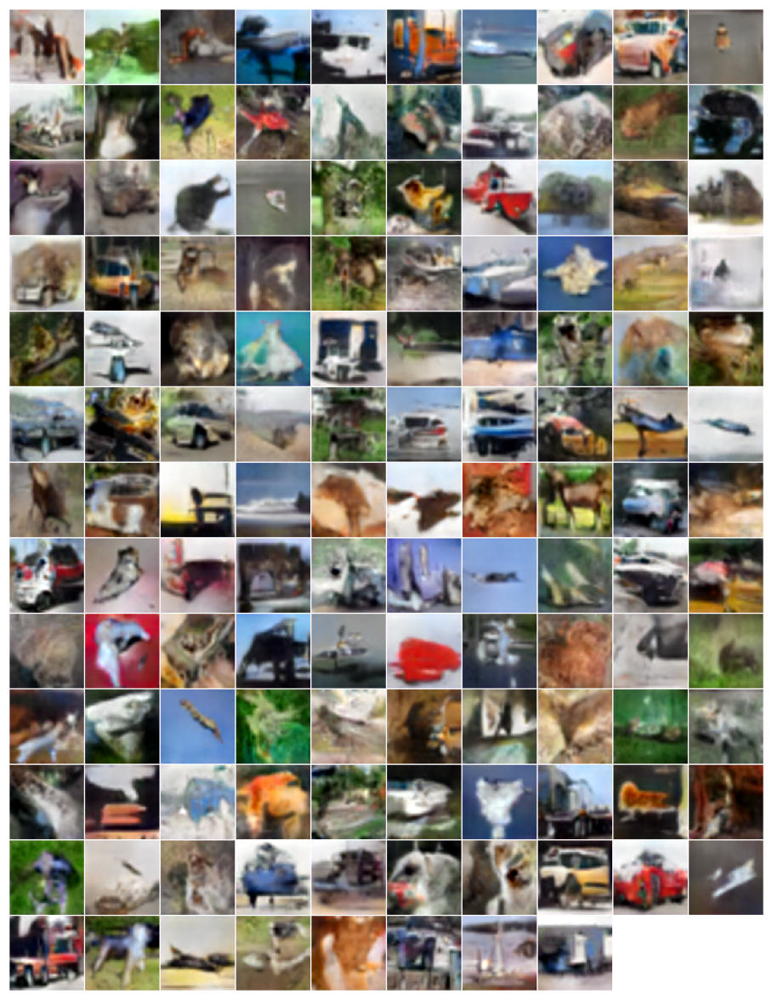

In [104]:
# GAN Tests
#model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
#model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load(content_path/'CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()*2
generated = make_grid(unnormalizer(generated, resize=True, w=32, h=32, channels=3)[:128].detach(), nrow=10, padding=1, normalize=False, 
                    value_range=None, scale_each=False, pad_value=2)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)